In [3]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import pandas as pd

### Czarne punkty na mapie to stacje z których są pobierane informacje

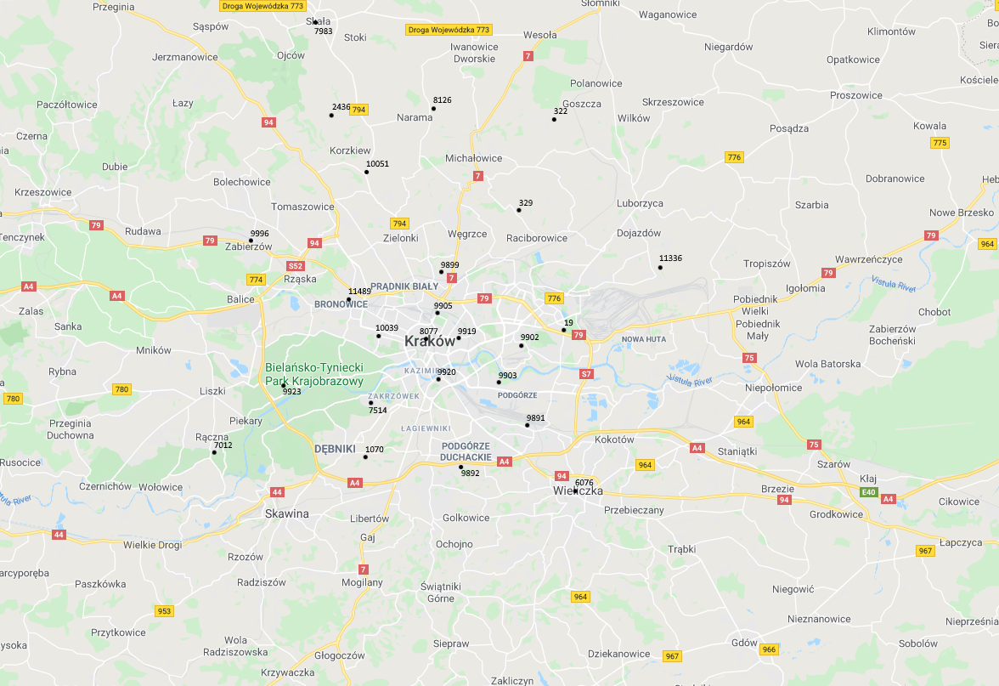

In [4]:
from IPython.display import Image
Image(filename='mapa_google.png') 
# TODO: oznaczyc kazda ze stacji jednym kolorem by byly zawsze takie same na wykresach

## Wczytanie danych z pliku csv

In [5]:
df = pd.read_csv('./dane1.csv', header = 0).iloc[:, 1:]
df = df.drop(columns=['indexLevel'])

In [6]:
df['fromDataTime'] = df['fromDataTime'].apply(lambda x: pd.to_datetime(x))
df['tillDateTime'] = df['tillDateTime'].apply(lambda x: pd.to_datetime(x))

dayOfWeekMap = {'Monday': 1, 'Tuesday': 2, 'Wednesday': 3, 'Thursday': 4, 'Friday': 5, 'Saturday': 6, 'Sunday': 7}
df['dayOfWeek'] = df['dayOfWeek'].apply(lambda x: dayOfWeekMap[x])
df['coronavirus'] = df['coronavirus'].apply(lambda x: 1 if x else 0)
df['typeOfDay'] = df['typeOfDay'].apply(lambda x: 1 if x == 'Weekend' else 0)

In [7]:
df

,installationId,fromDataTime,tillDateTime,PM1,PM10,PM25,PRESSURE,HUMIDITY,TEMPERATURE,indexValue,NO2,CO,CLOUDCOVER,WINDDIRECTION,WINDSPEED,dayOfWeek,coronavirus,typeOfDay
0,313,2020-04-24 18:00:00,2020-04-24 19:00:00,24.85,71.28,38.85,1004.98,45.34,14.56,63.30,NaN,NaN,96,240.0,2.6,5,1,0
1,8126,2020-04-24 18:00:00,2020-04-24 19:00:00,9.91,28.54,16.22,1005.01,47.07,14.10,28.54,NaN,NaN,95,240.0,2.6,5,1,0
2,332,2020-04-24 18:00:00,2020-04-24 19:00:00,10.68,26.75,14.60,1004.28,30.83,14.93,26.75,NaN,NaN,96,240.0,2.6,5,1,0
3,10051,2020-04-24 18:00:00,2020-04-24 19:00:00,25.39,52.09,40.54,1004.37,42.69,14.48,60.54,NaN,NaN,96,240.0,2.6,5,1,0
4,9899,2020-04-24 18:00:00,2020-04-24 19:00:00,8.63,18.39,10.94,1006.63,41.77,16.04,18.39,NaN,NaN,97,240.0,2.6,5,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4511,7012,2020-05-03 16:00:00,2020-05-03 17:00:00,33.32,72.78,47.46,1015.65,67.01,11.67,67.46,NaN,NaN,40,280.0,3.6,7,1,1
4512,9996,2020-05-03 16:00:00,2020-05-03 17:00:00,NaN,10.38,NaN,1016.00,76.00,10.33,10.38,NaN,NaN,40,280.0,3.6,7,1,1
4513,11489,2020-05-03 16:00:00,2020-05-03 17:00:00,6.02,14.80,8.21,1017.03,65.67,11.45,14.80,NaN,NaN,40,280.0,3.6,7,1,1
4514,10039,2020-05-03 16:00:00,2020-05-03 17:00:00,6.58,15.88,9.09,1017.31,47.67,10.94,15.88,NaN,NaN,40,280.0,3.6,7,1,1


In [58]:
installationd_id = df['installationId'].unique()
installationd_id.sort()
measurements_by_installation_id = dict()
for id in installationd_id:
    measurements_by_installation_id[id] = df.loc[df['installationId'] == id]

dict_keys([19, 313, 332, 1070, 6076, 7012, 7514, 8077, 8126, 9891, 9892, 9899, 9902, 9903, 9905, 9919, 9920, 9996, 10039, 10051, 11336, 11489])

In [59]:
installations = pd.read_csv('./installation.csv', header = 0).iloc[:, :]
installations

,id,latitude,longitude,country,city,street,buildingNumber,elevation,airly
0,19,50.069308,20.053492,Poland,Kraków,Bulwarowa,30,203.87,0
1,329,50.131500,20.014326,Poland,Ksiazniczki,NaN,NaN,227.36,1
2,332,50.175018,20.039064,Poland,Zagórzyce Dworskie,NaN,NaN,315.70,1
3,1070,50.002872,19.891985,Poland,Kraków,Profesora Geremka,26,245.78,1
4,6076,49.985546,20.059961,Poland,Wieliczka,Stanislawa Moniuszki,1,240.53,1
5,7012,50.006187,19.769005,Poland,Raczna,NaN,NaN,223.38,1
6,7514,50.033099,19.895774,Poland,Kraków,Skalica,21B,212.05,1
7,313,50.230379,19.853520,Poland,Skala,Rynek,20-21,416.64,0
8,8077,50.062006,19.940984,Poland,Kraków,Mikolajska,4,220.38,1
9,8126,50.185143,19.947767,Poland,Kozierów,NaN,NaN,359.71,1


## Nazwy stacji

In [10]:
installations_labels = dict()
for _, installation in installations.iterrows():
    installation_name = '%s - %s' % (installation['city'], installation['street'])
    installations_labels[installation['id']] = installation_name

## Wyliczenie okresów kiedy były weekendy

In [11]:
import datetime
holidays = [datetime.datetime(2020, 5, 1).date(), datetime.datetime(2020, 5, 3).date()]
coronavirus = [datetime.datetime(2020, 4, 24).date(), datetime.datetime.now().date()]
begin_date = datetime.datetime(2020, 4, 24)
end_date = datetime.datetime(2020, 4, 25)
weekends = []
while end_date < datetime.datetime.now():
    weekends.append((begin_date.date(), end_date.date()))
    begin_date = begin_date + datetime.timedelta(days=7)
    end_date = end_date + datetime.timedelta(days=7)

## Wykresy wszystykich stacji

In [12]:
def setup_x_axis(ax, measurements):
    days = mdates.DayLocator()
    days_fmt = mdates.DateFormatter('%m-%d')
    
    ax.xaxis.set_major_locator(days)
    ax.xaxis.set_major_formatter(days_fmt)
    ax.xaxis.set_major_locator(mdates.DayLocator(interval=1))
    ax.axvspan(holidays[0], holidays[1], color='red', alpha=0.5)
    ax.axvspan(coronavirus[0], coronavirus[1], color='green', alpha=0.1)
    for (start, end) in weekends:
        ax.axvspan(start, end, color='blue', alpha=0.3)
    ax.grid(True)

In [13]:
import matplotlib.dates as mdates

def plotAllData(column: str):
    fig, ax = plt.subplots()

    fig.set_figheight(15)
    fig.set_figwidth(30)
    for id, measurements in measurements_by_installation_id.items():
        ax.plot(measurements.fromDataTime, measurements[column], label=installations_labels[id])

    setup_x_axis(ax, measurements)

    plt.xlabel('Dzień')
    plt.ylabel(column)
    plt.title(column)
    plt.legend()

    plt.show()

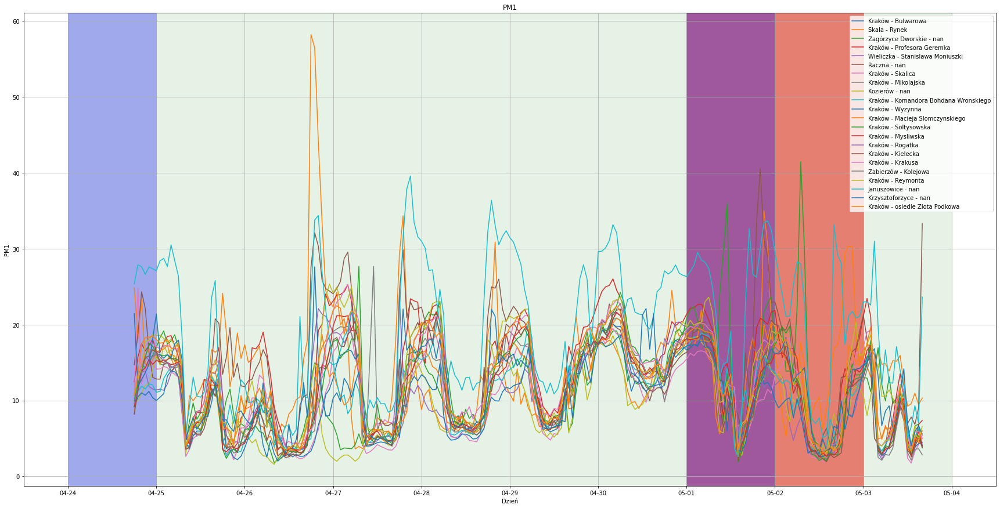

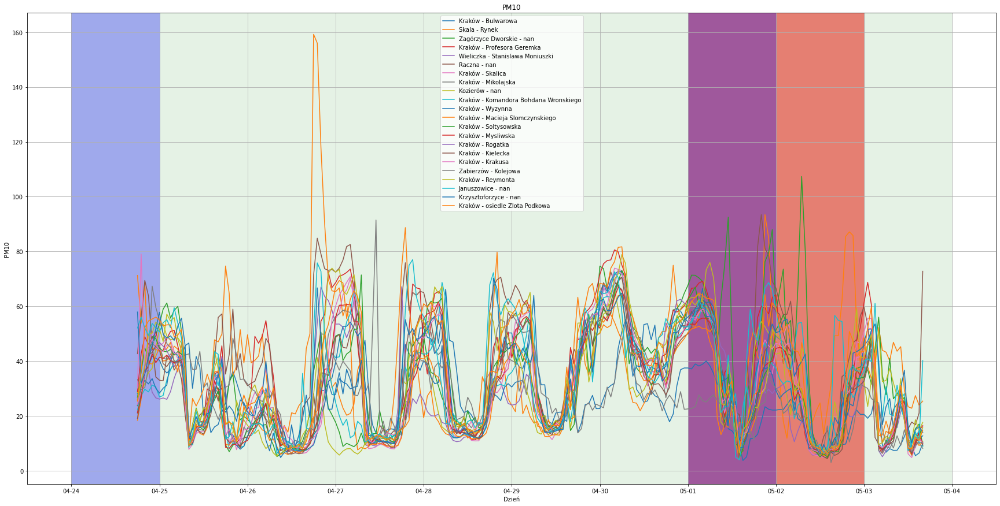

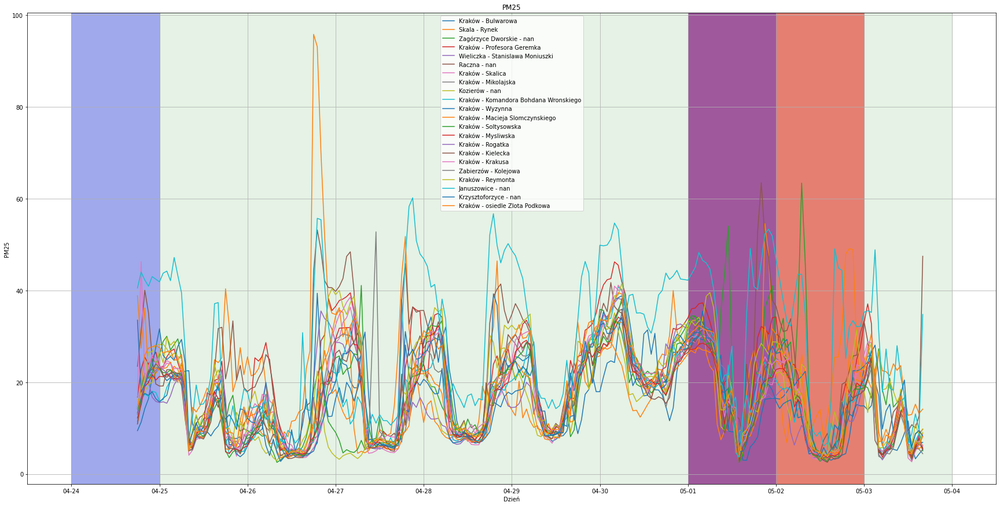

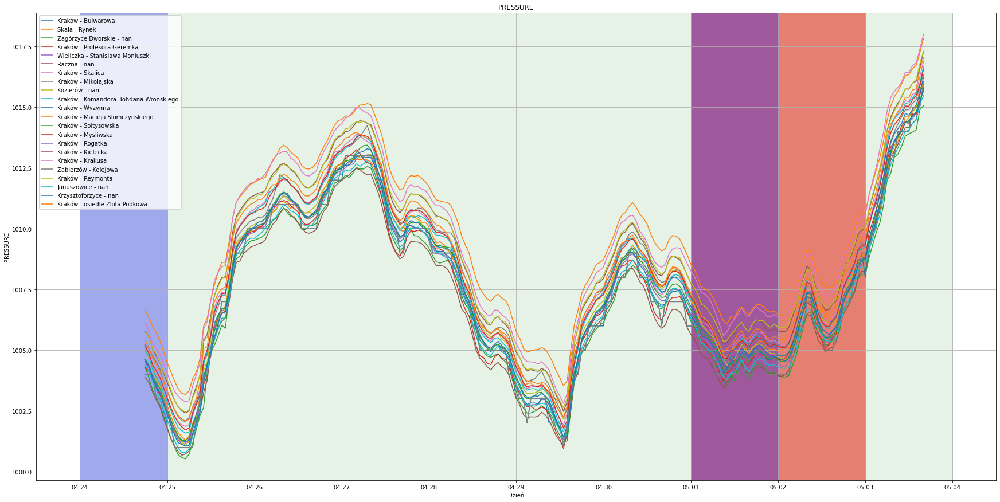

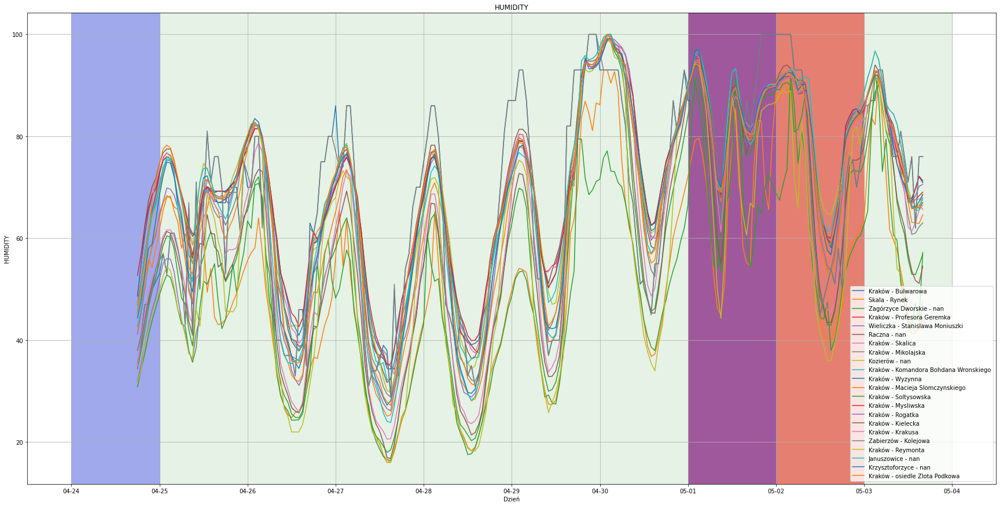

...

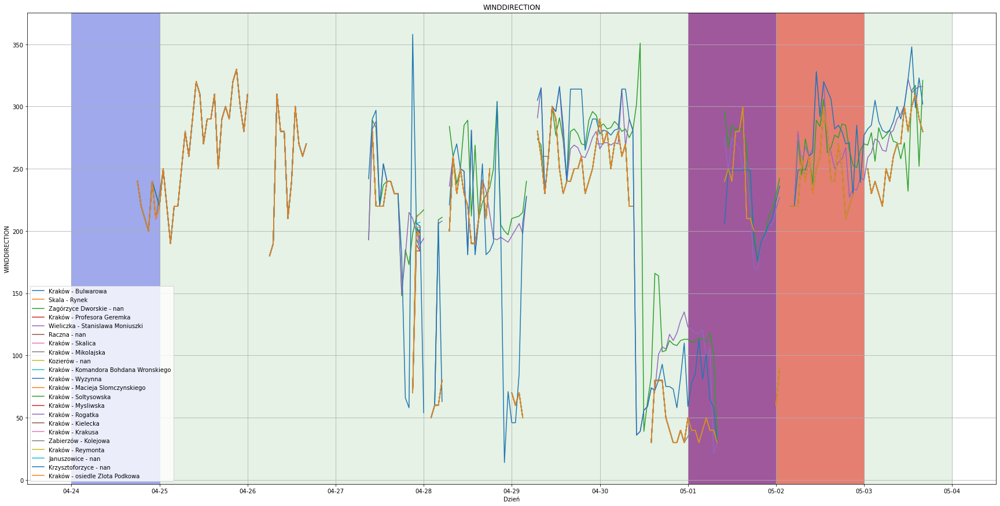

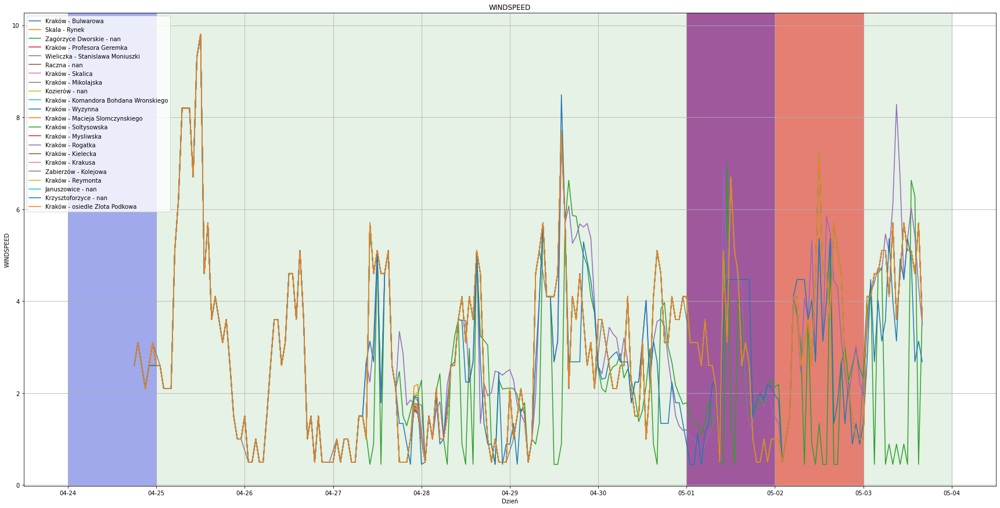

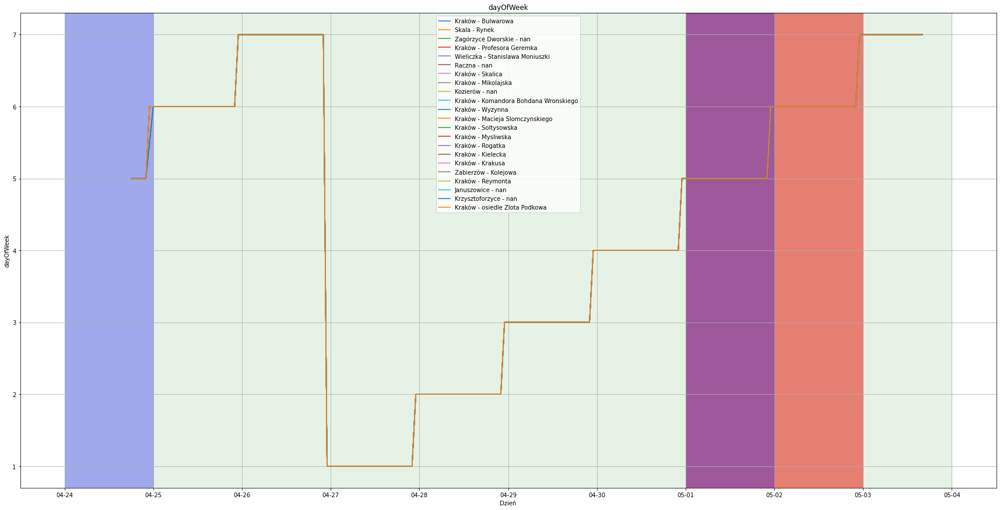

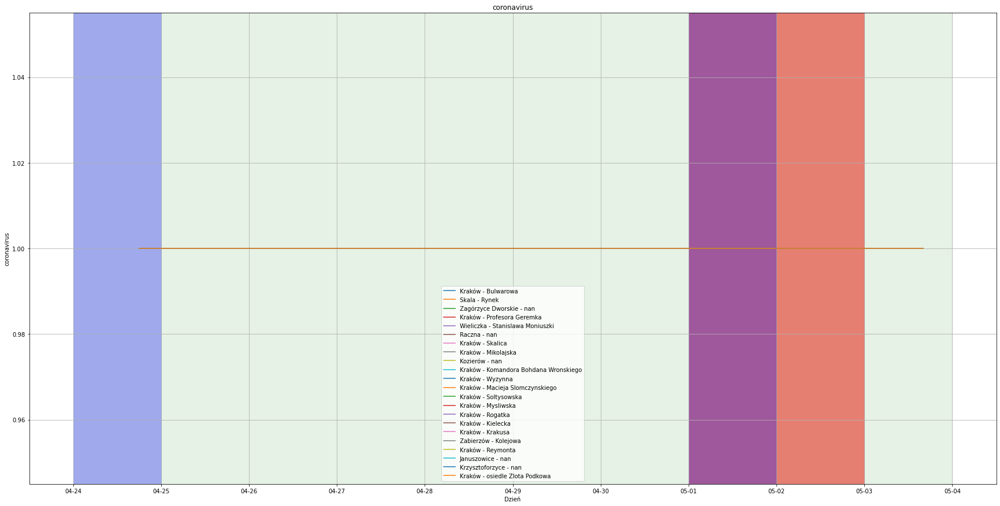

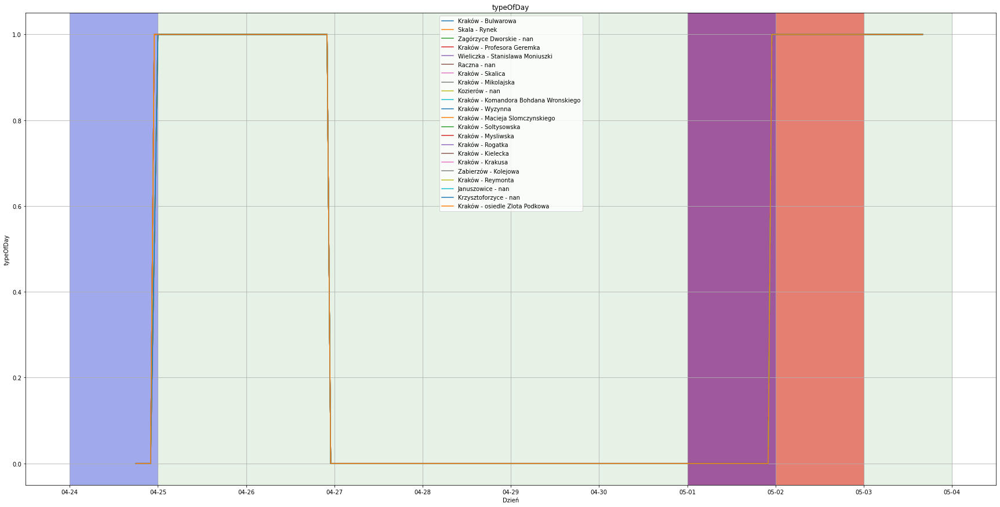

In [14]:
columns_to_plot = np.delete(df.columns.values, (0, 1, 2))
columns_to_plot
for col in columns_to_plot:
    plotAllData(col)

In [15]:
which_measure = 1

def plot_humidity(installation_id):
    measurements = measurements_by_installation_id[installation_id]
    if(measurements['HUMIDITY'].isnull().all()):
        return
    
    fig, ax = plt.subplots()
    fig.set_figheight(15)
    fig.set_figwidth(30)
    
    ax.plot(measurements.fromDataTime, measurements['HUMIDITY'], label=installations_labels[installation_id])

    setup_x_axis(ax, measurements)

    plt.xlabel('Dzień')
    plt.ylabel('Wilgotność [%]')
    plt.title('Wilgotność dla czujnika: %s' % (installations_labels[installation_id]))

  #  plot_name = 'HUMIDITY_' + str(installation_id)
  #  plt.savefig('./plots/%s_%d.png' % (plot_name, which_measure))
    plt.show()

In [16]:
def plot_temperature(installation_id):
    measurements = measurements_by_installation_id[installation_id]
    if(measurements['TEMPERATURE'].isnull().all()):
        return
    
    fig, ax = plt.subplots()
    fig.set_figheight(15)
    fig.set_figwidth(30)
    
    ax.plot(measurements.fromDataTime, measurements['TEMPERATURE'], label=installations_labels[installation_id])
    
    setup_x_axis(ax, measurements)

    plt.xlabel('Dzień')
    plt.ylabel('Temperatura [C]')
    plt.title('Temperatura dla czujnika: %s' % (installations_labels[installation_id]))

 #   plot_name = 'TEMPERATURE_' + str(installation_id)
  #  plt.savefig('./plots/%s_%d.png' % (plot_name, which_measure))
    plt.show()

## Wykresy temperatury dla każdej stacji

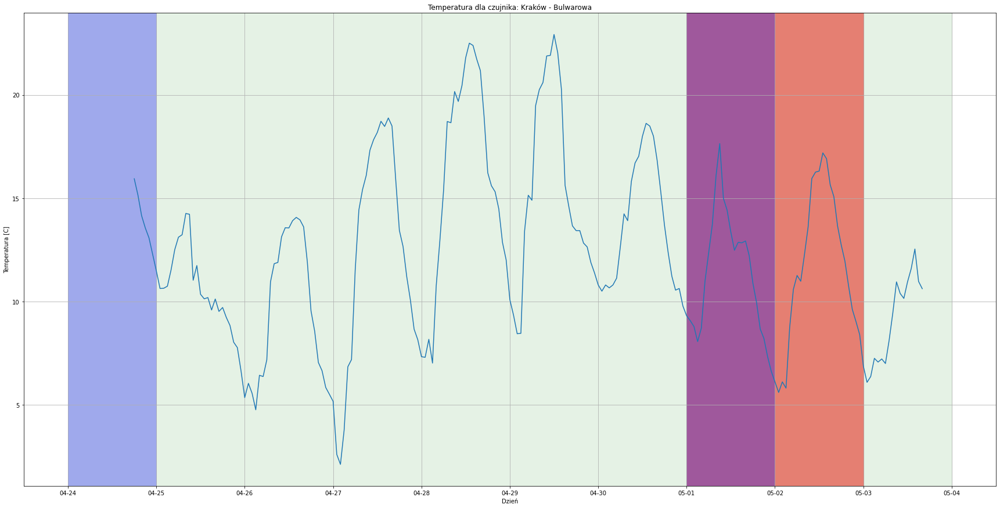

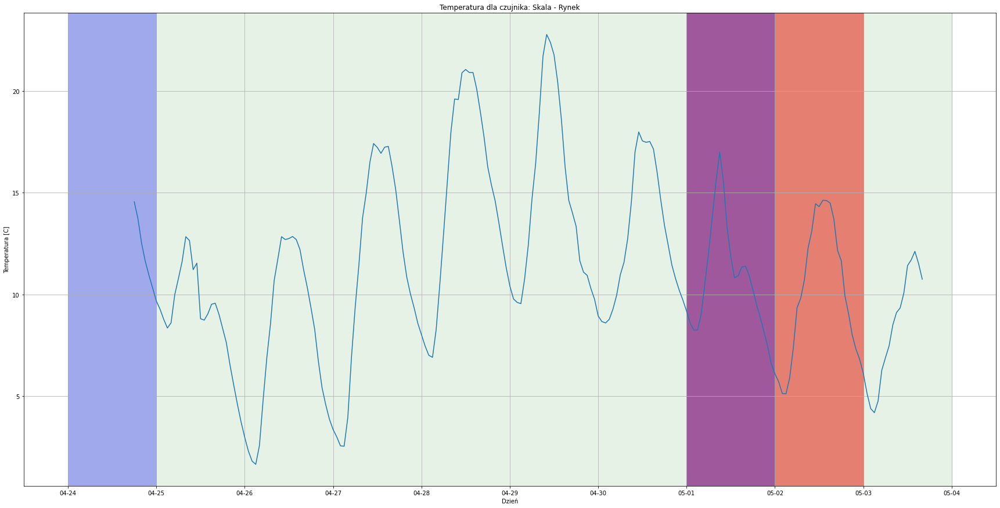

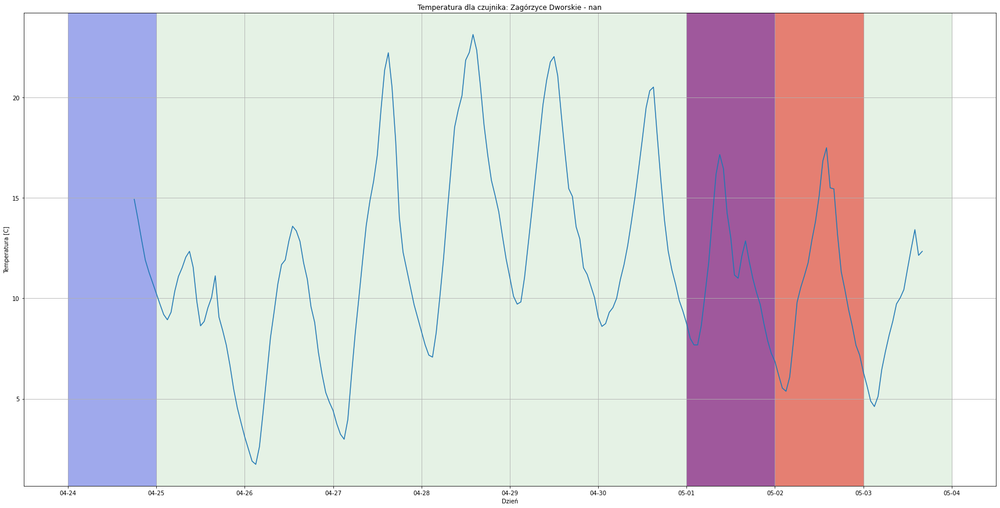

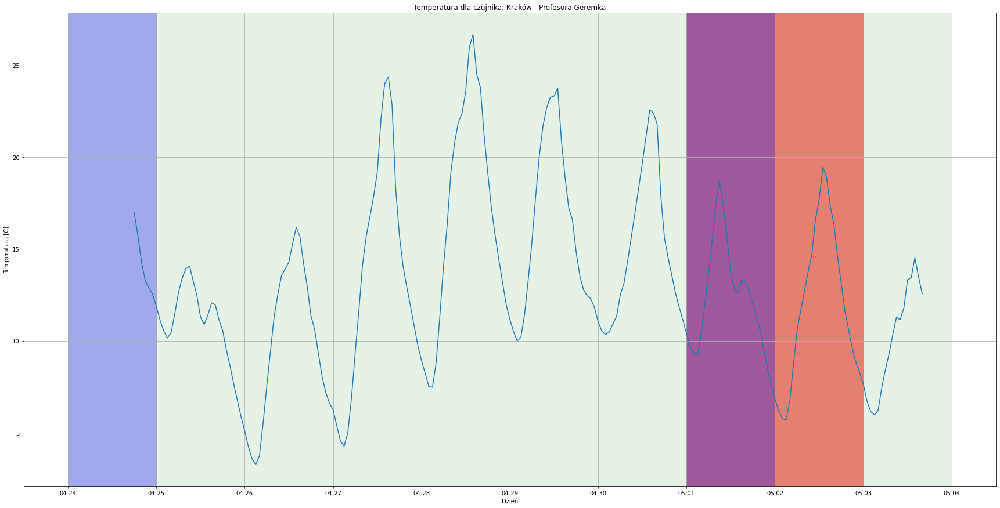

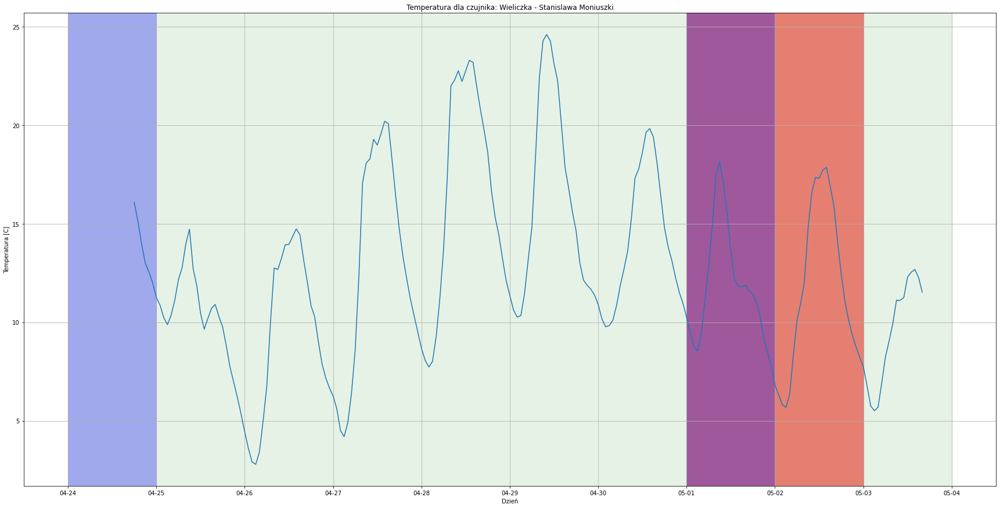

...

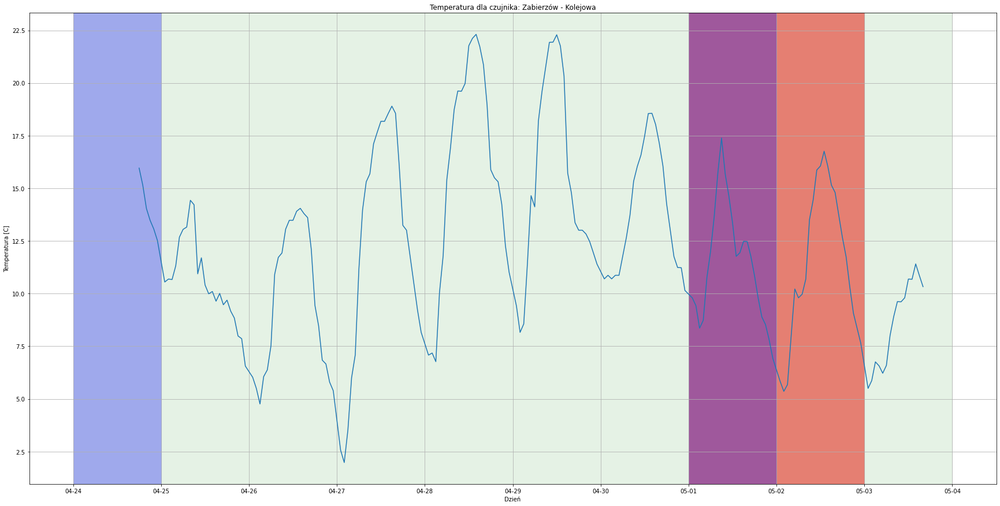

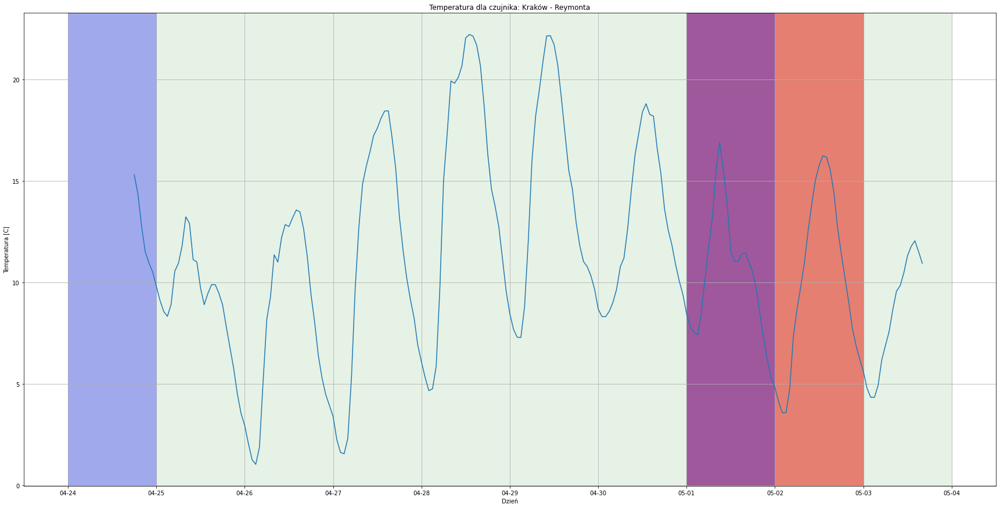

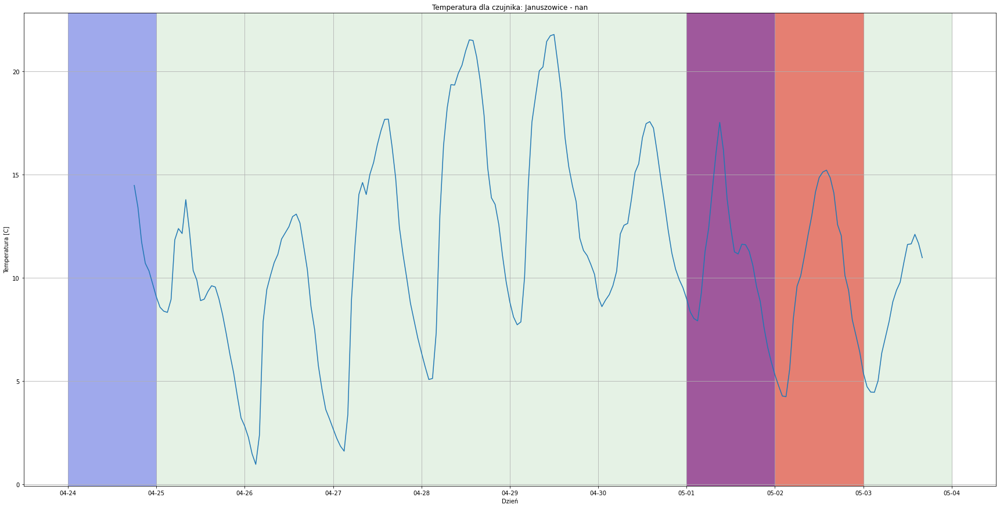

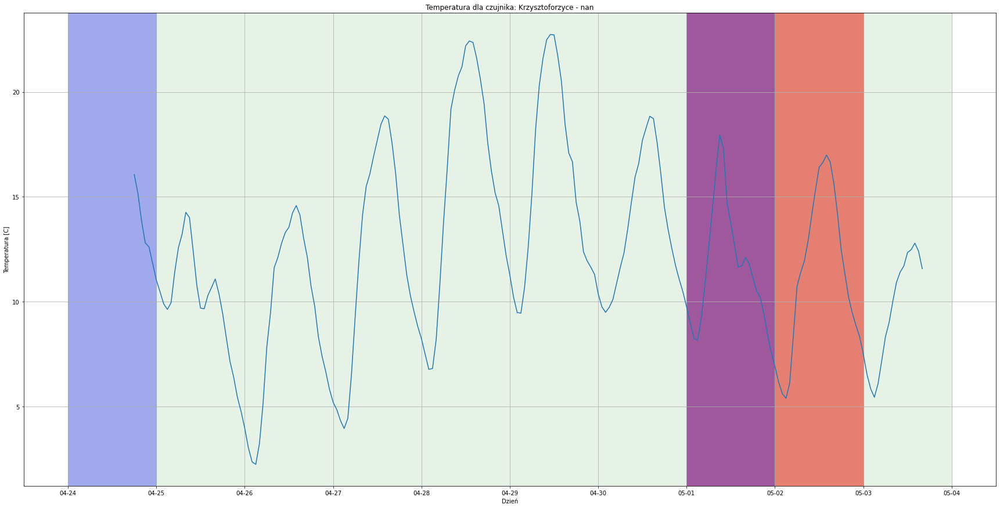

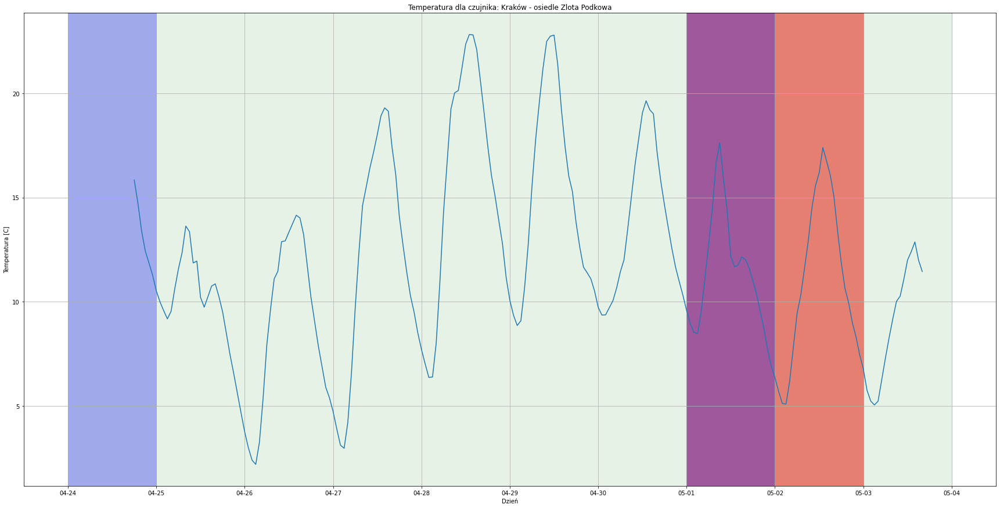

In [17]:
for id in installationd_id:
    plot_temperature(id)

## Wykresy wilgotności dla każdej stacji

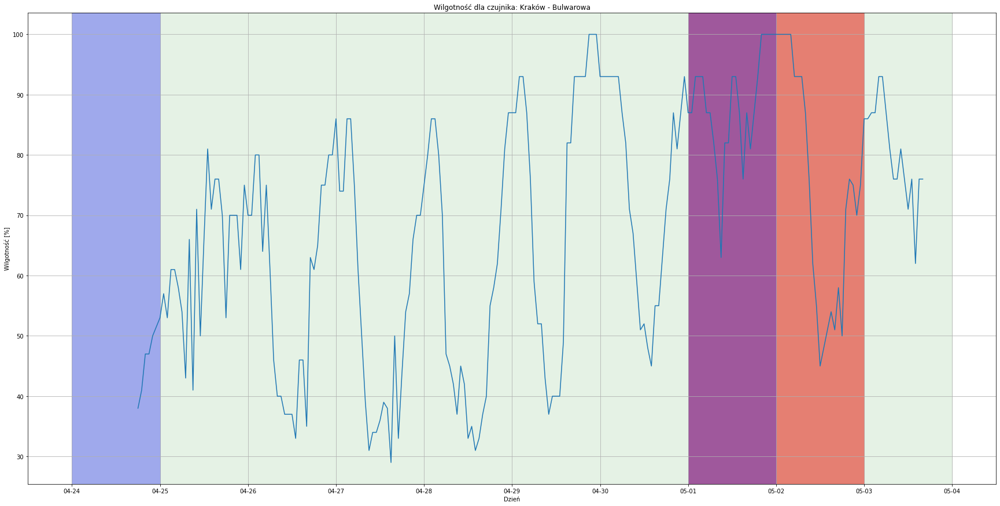

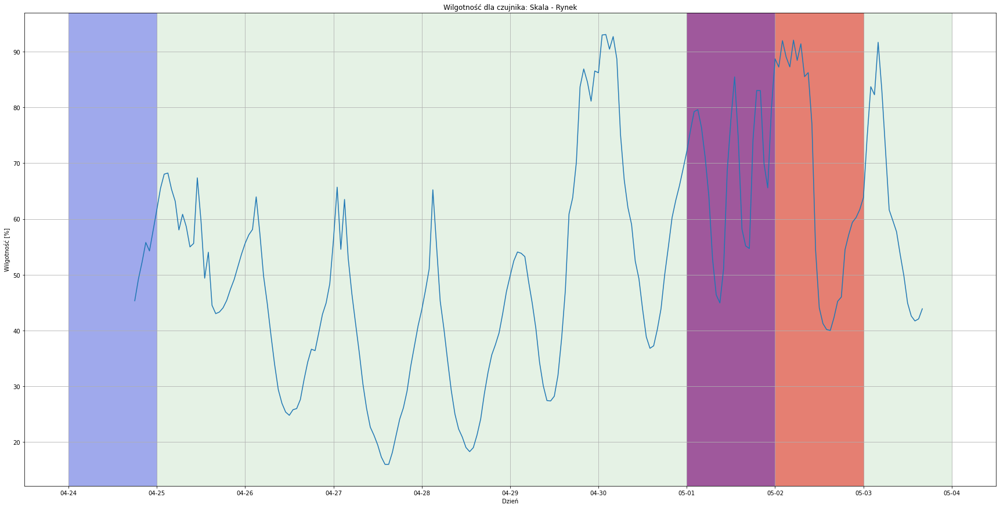

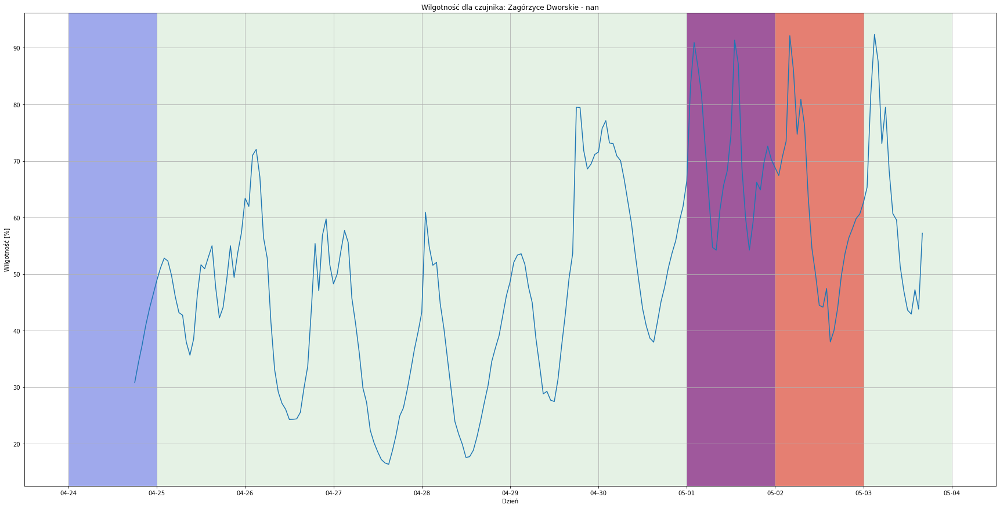

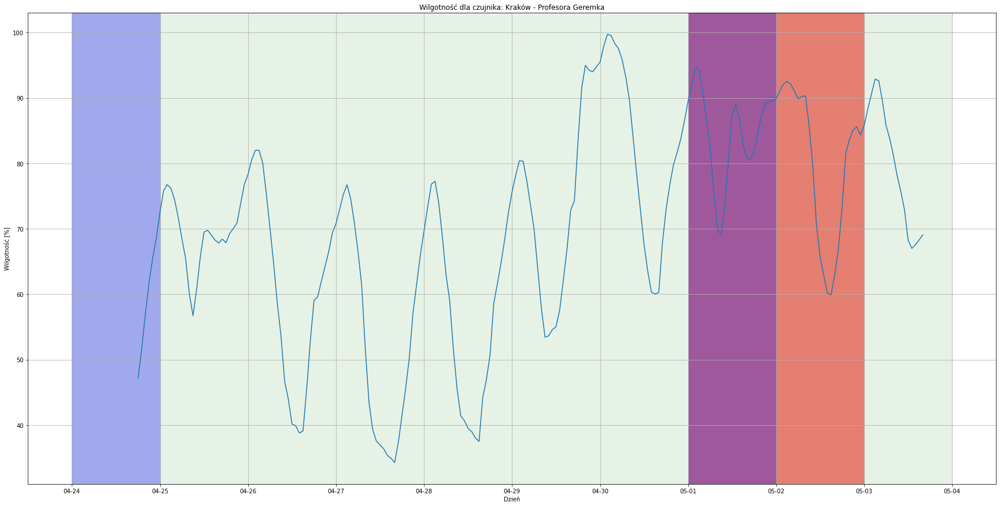

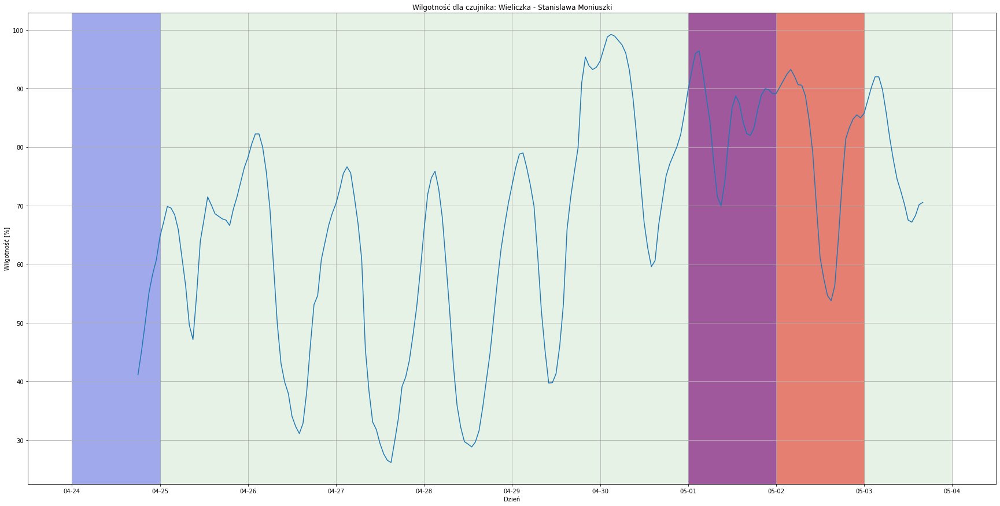

...

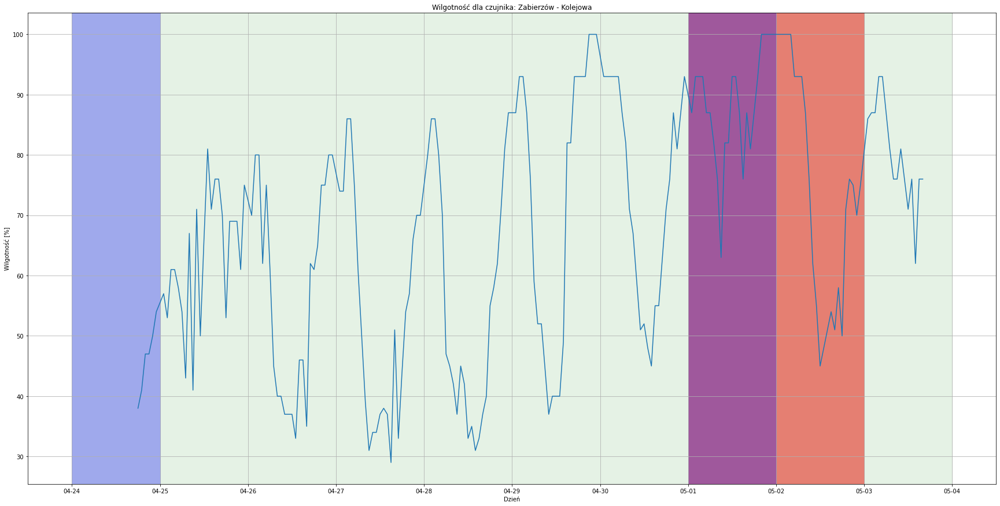

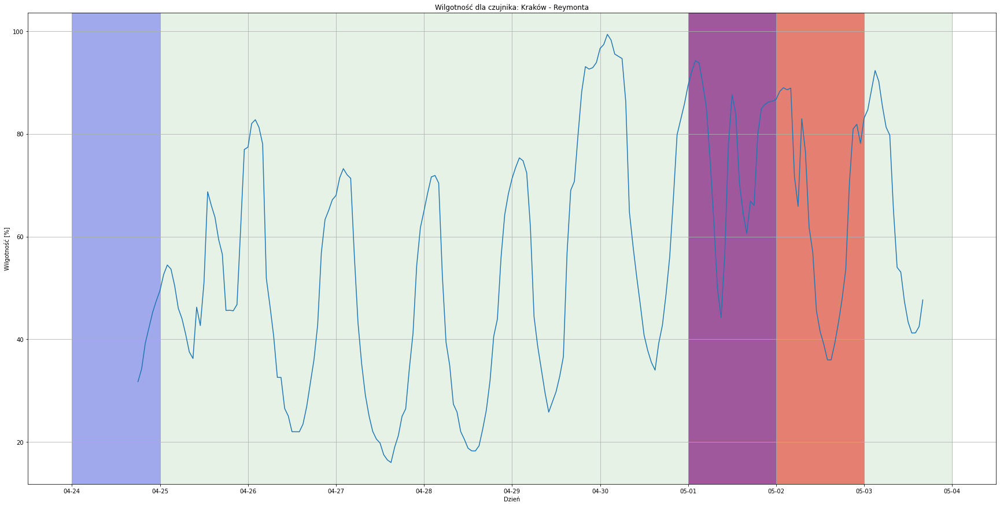

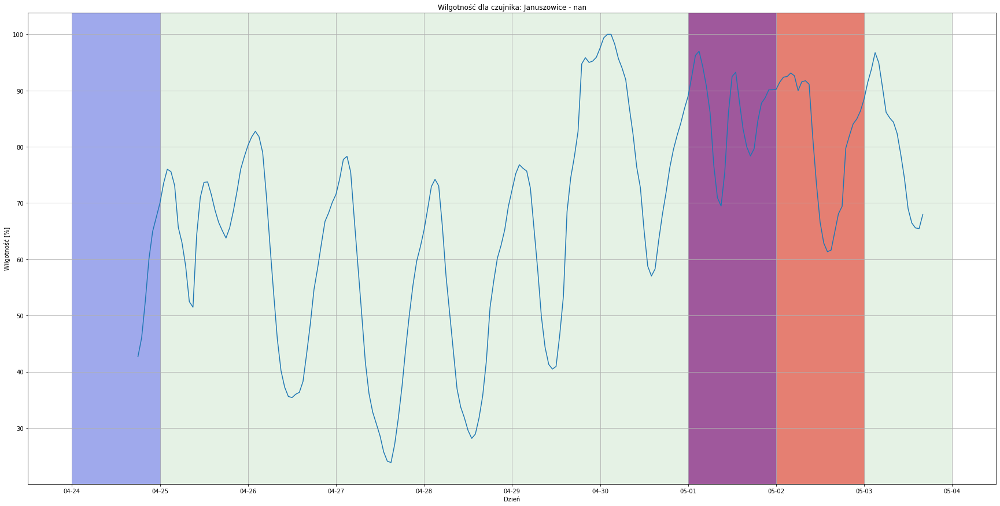

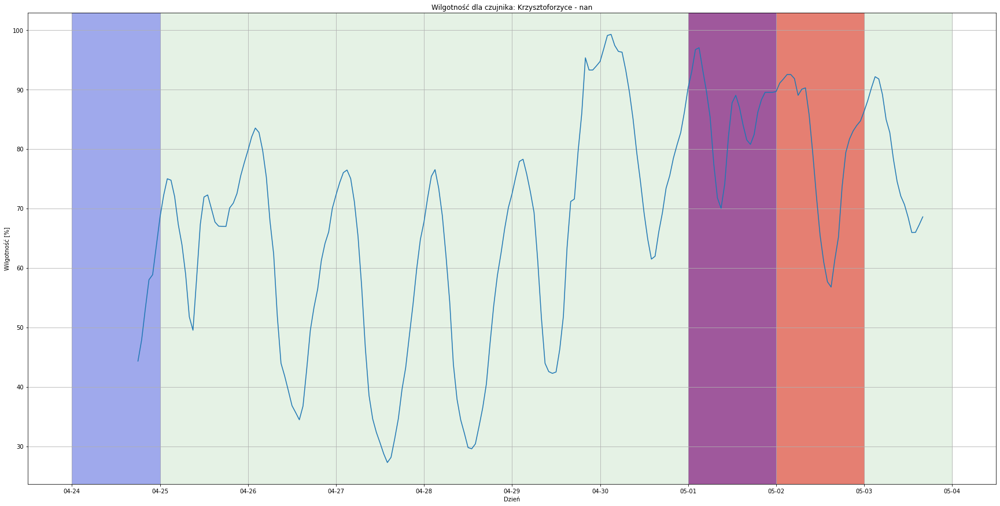

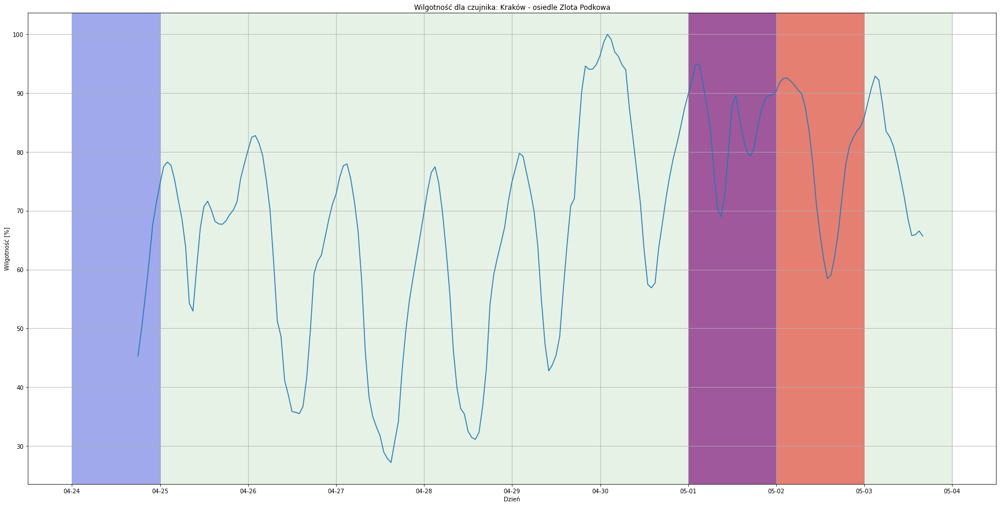

In [18]:
for id in installationd_id:
    plot_humidity(id)

## Wykresy dla każdego z kierunku

In [19]:
def plotDataForRegion(installationIds, column, title):
    fig, ax = plt.subplots()

    fig.set_figheight(15)
    fig.set_figwidth(30)
    for id in installationIds:
        measurements = df.loc[df['installationId'] == id]
        ax.plot(measurements.fromDataTime, measurements[column], label=installations_labels[id])

    setup_x_axis(ax, measurements)

    plt.xlabel('Dzień')
    plt.ylabel(column)
    plt.title(title)
    plt.legend()

    plt.show()

In [20]:
north = [313, 8126, 332, 10051, 329, 9899]
east = [11336, 19, 6076, 9902, 9891, 9903, 9919]
south = [9892, 1070, 7514, 9920, 9905]
west = [7012, 9996, 9923, 11489, 10039, 8077]

# north = installations[installations['region'] == 'N']['id']
# east = installations[installations['region'] == 'E']['id']
# south = installations[installations['region'] == 'S']['id']
# west = installations[installations['region'] == 'W']['id']

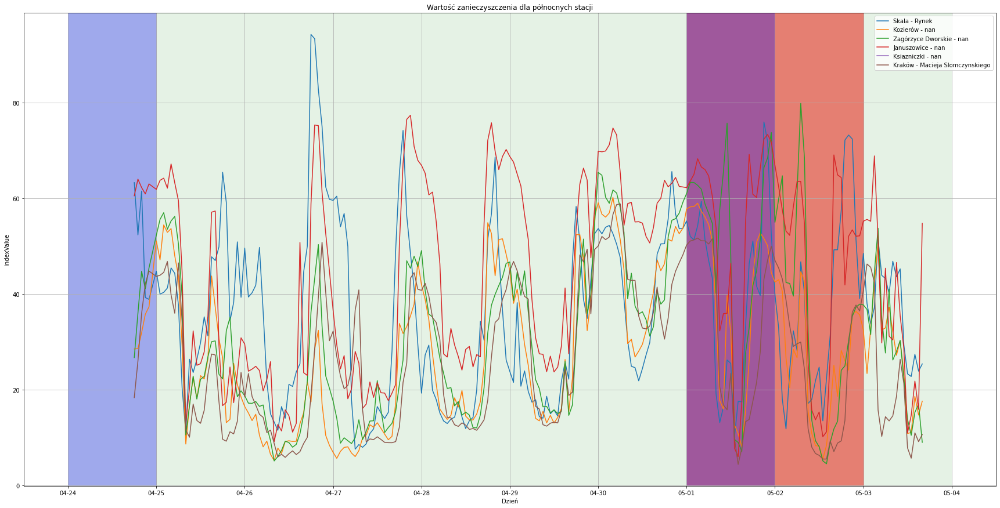

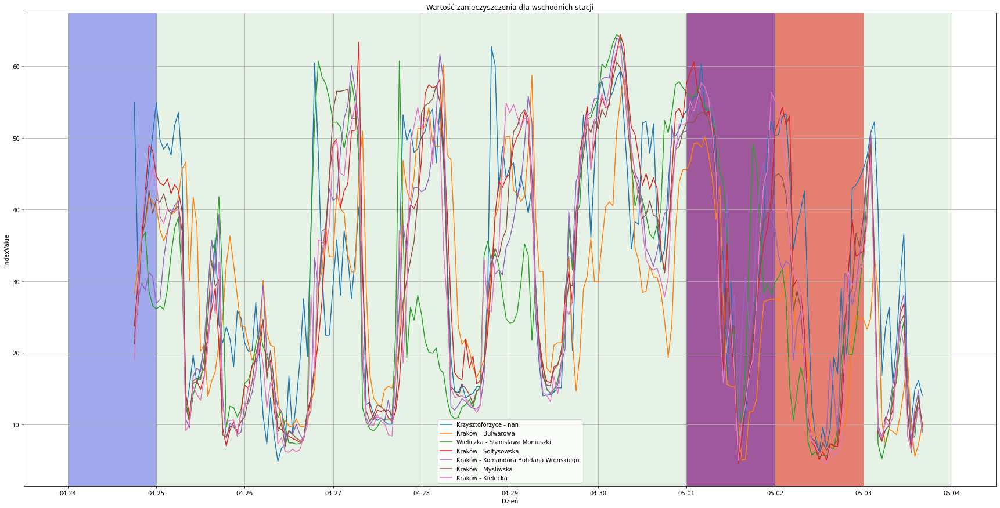

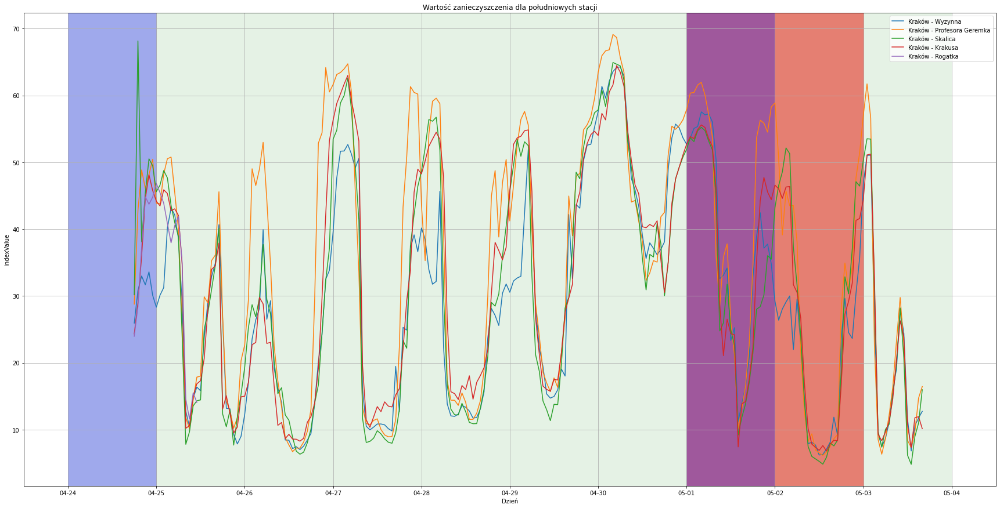

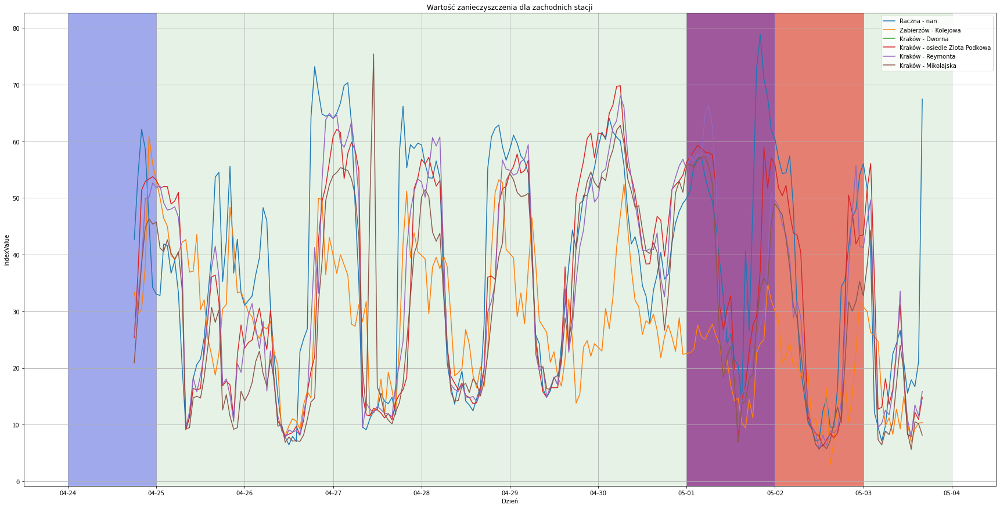

In [21]:
plotDataForRegion(north, 'indexValue', 'Wartość zanieczyszczenia dla północnych stacji')
plotDataForRegion(east, 'indexValue', 'Wartość zanieczyszczenia dla wschodnich stacji')
plotDataForRegion(south, 'indexValue', 'Wartość zanieczyszczenia dla południowych stacji')
plotDataForRegion(west, 'indexValue', 'Wartość zanieczyszczenia dla zachodnich stacji')

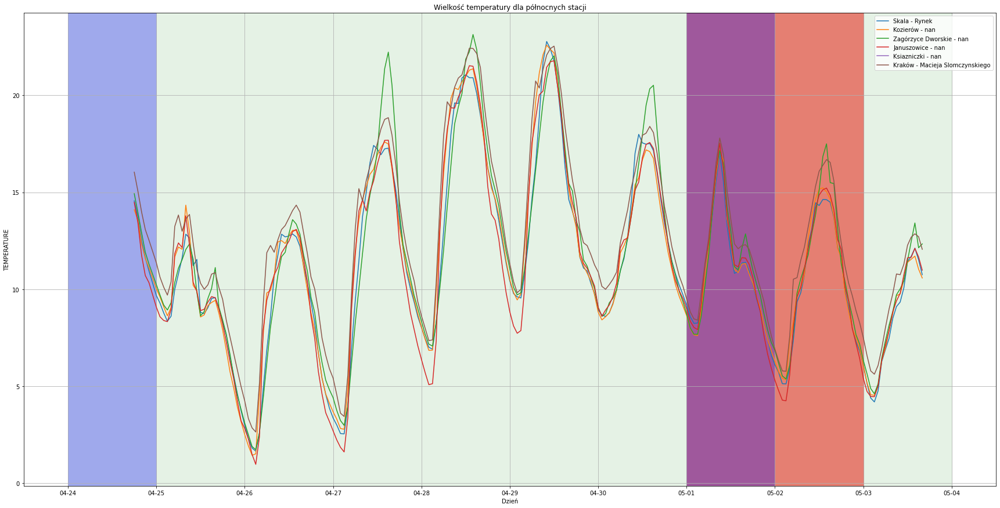

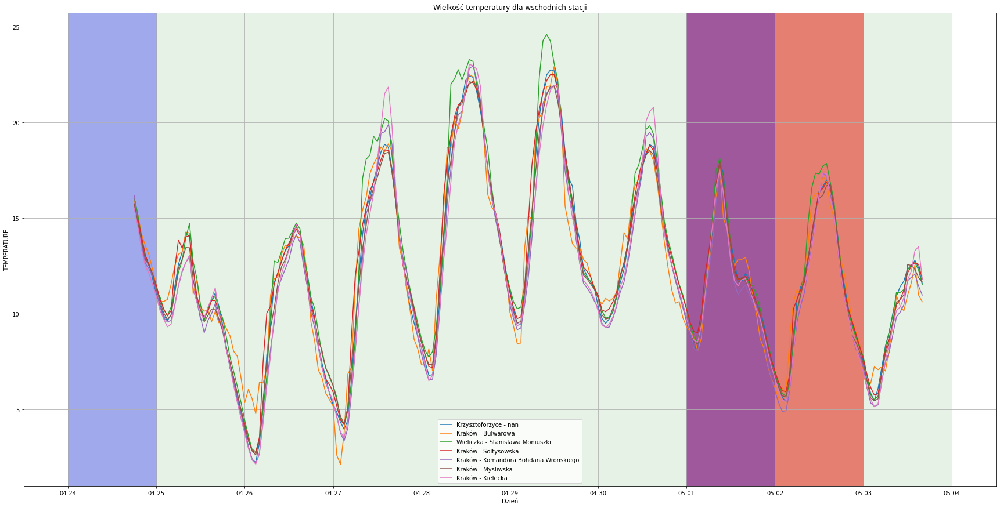

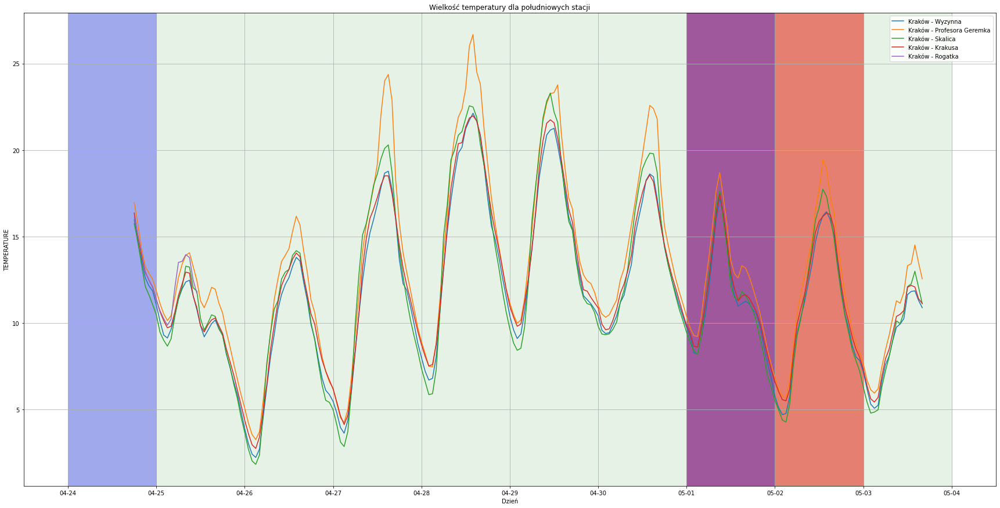

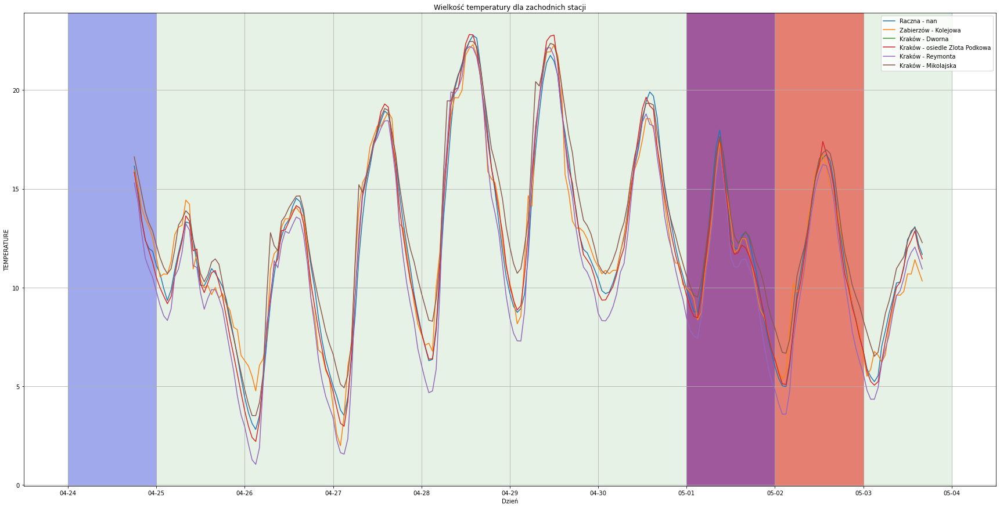

In [22]:
plotDataForRegion(north, 'TEMPERATURE', 'Wielkość temperatury dla północnych stacji')
plotDataForRegion(east, 'TEMPERATURE', 'Wielkość temperatury dla wschodnich stacji')
plotDataForRegion(south, 'TEMPERATURE', 'Wielkość temperatury dla południowych stacji')
plotDataForRegion(west, 'TEMPERATURE', 'Wielkość temperatury dla zachodnich stacji')

## Przetwarzanie danych

In [23]:
from sklearn import preprocessing

data = df.drop(['installationId', 'fromDataTime', 'tillDateTime'] , axis='columns')
data.corr()

,PM1,PM10,PM25,PRESSURE,HUMIDITY,TEMPERATURE,indexValue,NO2,CO,CLOUDCOVER,WINDDIRECTION,WINDSPEED,dayOfWeek,coronavirus,typeOfDay
PM1,1.000000,0.947472,0.988261,-0.173888,0.399431,-0.304449,0.967237,NaN,NaN,0.201224,-0.437100,-0.350972,-0.177390,NaN,-0.302497
PM10,0.947472,1.000000,0.963136,-0.149407,0.430211,-0.324835,0.983988,0.668620,0.710670,0.228758,-0.429618,-0.351591,-0.166429,NaN,-0.309127
PM25,0.988261,0.963136,1.000000,-0.156215,0.436478,-0.319332,0.977498,0.489629,0.775591,0.221082,-0.428080,-0.340351,-0.161295,NaN,-0.303314
PRESSURE,-0.173888,-0.149407,-0.156215,1.000000,-0.092672,-0.319228,-0.171176,-0.100830,-0.174349,-0.115941,0.119551,-0.164563,0.044618,NaN,0.201396
HUMIDITY,0.399431,0.430211,0.436478,-0.092672,1.000000,-0.579757,0.445267,-0.050424,0.408640,0.276376,-0.170368,-0.146948,0.294992,NaN,0.066662
TEMPERATURE,-0.304449,-0.324835,-0.319332,-0.319228,-0.579757,1.000000,-0.329930,0.067040,-0.299521,-0.059159,0.061856,0.344256,-0.389477,NaN,-0.409664
indexValue,0.967237,0.983988,0.977498,-0.171176,0.445267,-0.329930,1.000000,0.597249,0.736448,0.231366,-0.445755,-0.355147,-0.167637,NaN,-0.312296
NO2,NaN,0.668620,0.489629,-0.100830,-0.050424,0.067040,0.597249,1.000000,0.684271,-0.000393,-0.279627,-0.401916,-0.568364,NaN,-0.491106
CO,NaN,0.710670,0.775591,-0.174349,0.408640,-0.299521,0.736448,0.684271,1.000000,0.003113,-0.591081,-0.529860,-0.394879,NaN,-0.400500
CLOUDCOVER,0.201224,0.228758,0.221082,-0.115941,0.276376,-0.059159,0.231366,-0.000393,0.003113,1.000000,-0.036701,0.042329,0.142247,NaN,-0.099818


## Wykres korelacji

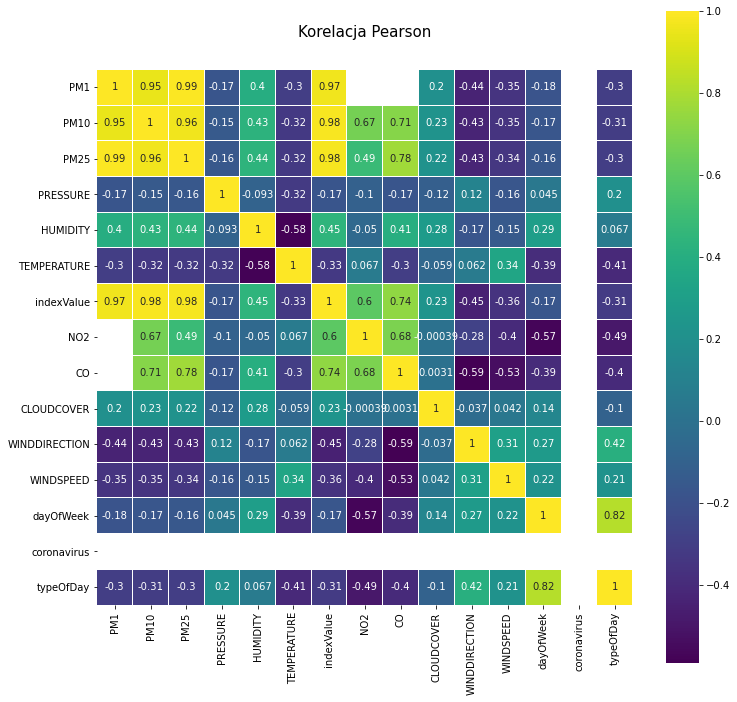

In [24]:
import seaborn as sns

colormap = plt.cm.viridis
plt.figure(figsize=(12,12))
plt.title('Korelacja Pearson', y=1.05, size=15)
sns.heatmap(data.astype(float).corr(),linewidths=0.1,vmax=1.0,
square=True, cmap=colormap, linecolor='white', annot=True)

## Korelacja pomiędzy temperaturą, wilgotnością a prędkością wiatru

In [25]:
from IPython.display import display, HTML

for id in installationd_id:
    dd = df.loc[df['installationId'] == id][['TEMPERATURE', 'HUMIDITY', 'WINDSPEED']]
    cor = dd.corr()
    print('Czujnik: ' + str(id))
    display(HTML(cor.to_html()))
    print()

Czujnik: 19


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.676163,0.361142
HUMIDITY,-0.676163,1.000000,-0.237207
WINDSPEED,0.361142,-0.237207,1.000000



Czujnik: 313


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.576031,0.352251
HUMIDITY,-0.576031,1.000000,-0.047485
WINDSPEED,0.352251,-0.047485,1.000000



Czujnik: 332


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.626779,0.147035
HUMIDITY,-0.626779,1.000000,-0.088718
WINDSPEED,0.147035,-0.088718,1.000000



Czujnik: 1070


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.644032,0.377563
HUMIDITY,-0.644032,1.000000,-0.160593
WINDSPEED,0.377563,-0.160593,1.000000



Czujnik: 6076


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.647164,0.309853
HUMIDITY,-0.647164,1.000000,-0.136724
WINDSPEED,0.309853,-0.136724,1.000000



Czujnik: 7012


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.638563,0.377333
HUMIDITY,-0.638563,1.000000,-0.185094
WINDSPEED,0.377333,-0.185094,1.000000



Czujnik: 7514


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.641609,0.377196
HUMIDITY,-0.641609,1.000000,-0.168515
WINDSPEED,0.377196,-0.168515,1.000000



Czujnik: 8077


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.651338,0.340072
HUMIDITY,-0.651338,1.000000,-0.206214
WINDSPEED,0.340072,-0.206214,1.000000



Czujnik: 8126


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.619675,0.329638
HUMIDITY,-0.619675,1.000000,-0.124017
WINDSPEED,0.329638,-0.124017,1.000000



Czujnik: 9891


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.633366,0.364653
HUMIDITY,-0.633366,1.000000,-0.172861
WINDSPEED,0.364653,-0.172861,1.000000



Czujnik: 9892


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.615886,0.366258
HUMIDITY,-0.615886,1.000000,-0.164110
WINDSPEED,0.366258,-0.164110,1.000000



Czujnik: 9899


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.609056,0.330966
HUMIDITY,-0.609056,1.000000,-0.157087
WINDSPEED,0.330966,-0.157087,1.000000



Czujnik: 9902


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.593386,0.361044
HUMIDITY,-0.593386,1.000000,-0.142625
WINDSPEED,0.361044,-0.142625,1.000000



Czujnik: 9903


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.613335,0.363550
HUMIDITY,-0.613335,1.000000,-0.163884
WINDSPEED,0.363550,-0.163884,1.000000



Czujnik: 9905


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.958406,0.266054
HUMIDITY,-0.958406,1.000000,-0.422870
WINDSPEED,0.266054,-0.422870,1.000000



Czujnik: 9919


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.602072,0.373630
HUMIDITY,-0.602072,1.000000,-0.142592
WINDSPEED,0.373630,-0.142592,1.000000



Czujnik: 9920


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.602551,0.353256
HUMIDITY,-0.602551,1.000000,-0.144519
WINDSPEED,0.353256,-0.144519,1.000000



Czujnik: 9996


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.679097,0.337120
HUMIDITY,-0.679097,1.000000,-0.219813
WINDSPEED,0.337120,-0.219813,1.000000



Czujnik: 10039


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.703341,0.389606
HUMIDITY,-0.703341,1.000000,-0.240287
WINDSPEED,0.389606,-0.240287,1.000000



Czujnik: 10051


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.605882,0.373216
HUMIDITY,-0.605882,1.000000,-0.142060
WINDSPEED,0.373216,-0.142060,1.000000



Czujnik: 11336


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.642946,0.334903
HUMIDITY,-0.642946,1.000000,-0.172423
WINDSPEED,0.334903,-0.172423,1.000000



Czujnik: 11489


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.669269,0.367476
HUMIDITY,-0.669269,1.000000,-0.191131
WINDSPEED,0.367476,-0.191131,1.000000


## Uśrednienie wartości dla danych grup

In [34]:
from sklearn.preprocessing import normalize

def plot_mean_data(group, title):
    data = df.loc[df['installationId'].isin(group)]
    dates = data['fromDataTime'].unique()

    means_temp = np.zeros(len(dates))
    means_hum = np.zeros(len(dates))
    means_index = np.zeros(len(dates))
    means_wind = np.zeros(len(dates))
    for d, i in zip(dates, range(len(dates))):
        m = data.loc[data['fromDataTime'] == d]['TEMPERATURE'].mean()
        means_temp[i] = m
        m = data.loc[data['fromDataTime'] == d]['HUMIDITY'].mean()
        means_hum[i] = m
        m = data.loc[data['fromDataTime'] == d]['indexValue'].mean()
        means_index[i] = m
        m = data.loc[data['fromDataTime'] == d]['WINDSPEED'].mean()
        means_wind[i] = m

    fig, ax = plt.subplots()
    fig.set_figheight(15)
    fig.set_figwidth(30)
    
    ax.plot(dates, means_temp, label='Temperatura')
    ax.plot(dates, means_hum, label='Wilgotność')
    ax.plot(dates, means_index, label='Jakość powietrza')
    ax.plot(dates, np.power(means_wind, 2), label='Prędkość wiatru')
    
    setup_x_axis(ax, 1)
    plt.legend()
    plt.xlabel('Czas')
    plt.title(title)
    
    plt.show()

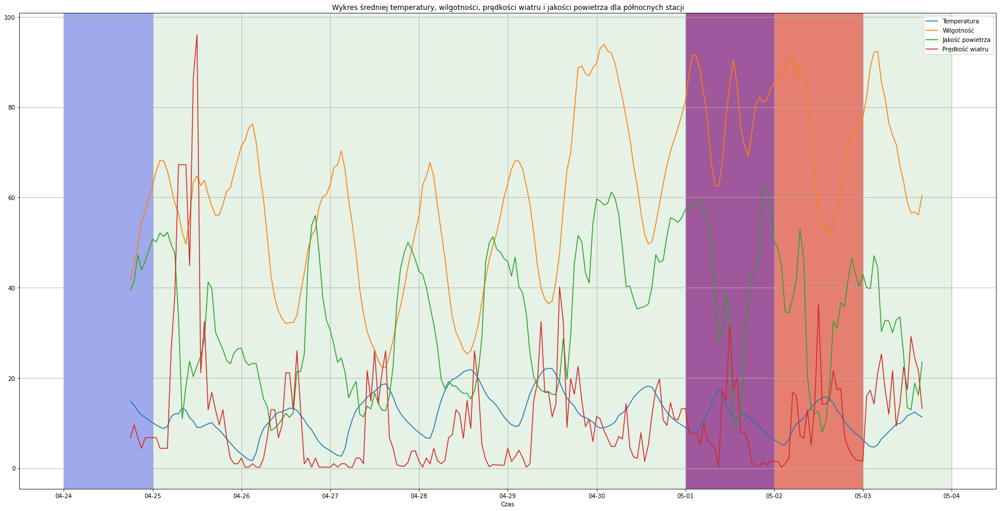

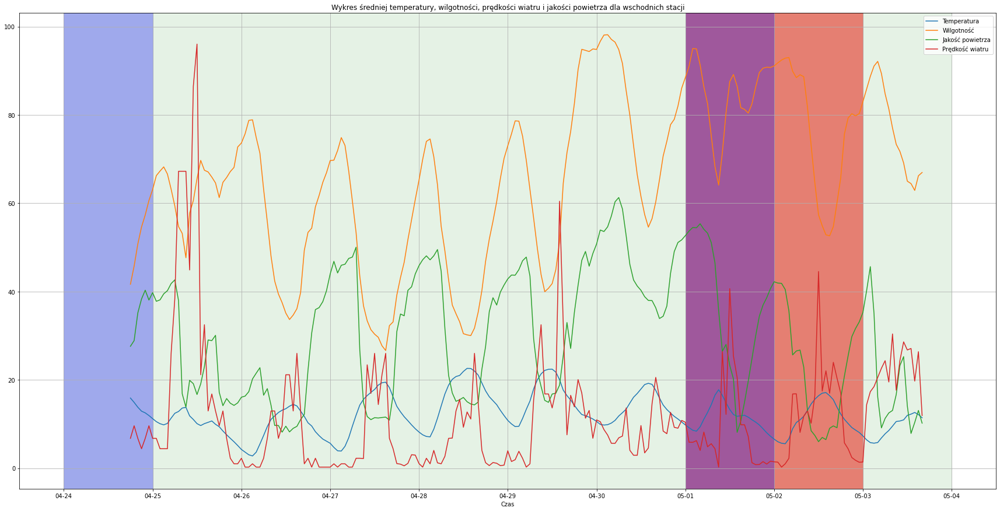

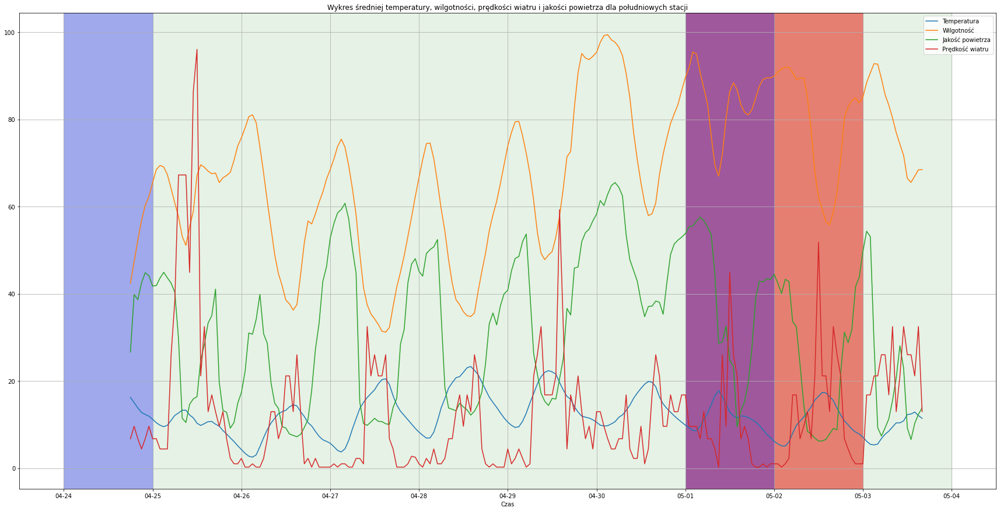

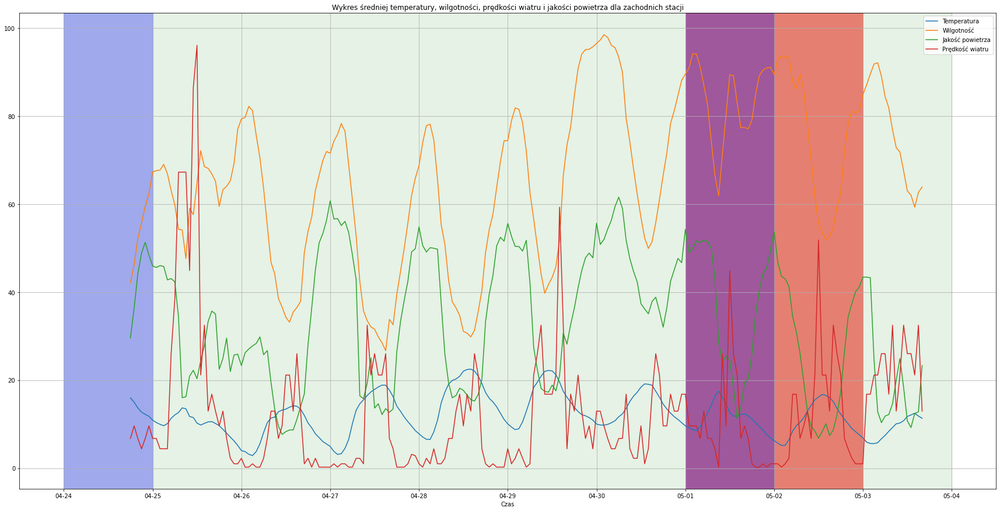

In [35]:
plot_mean_data(north, 'Wykres średniej temperatury, wilgotności, prędkości wiatru i jakości powietrza dla północnych stacji')
plot_mean_data(east, 'Wykres średniej temperatury, wilgotności, prędkości wiatru i jakości powietrza dla wschodnich stacji')
plot_mean_data(south, 'Wykres średniej temperatury, wilgotności, prędkości wiatru i jakości powietrza dla południowych stacji')
plot_mean_data(west, 'Wykres średniej temperatury, wilgotności, prędkości wiatru i jakości powietrza dla zachodnich stacji')

In [70]:
import math
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.collections import LineCollection

def plot_winddirection(installation_id):
    measurements = measurements_by_installation_id[installation_id]
    if(measurements['TEMPERATURE'].isnull().all()):
        return
    x = []
    y = []
    dydx = []
    dates = []
    nan=float('nan')
    math.isnan(nan)
    for i, m in enumerate(measurements.iterrows()):
        x.append(m[1]['fromDataTime'].timetuple().tm_yday + m[1]['fromDataTime'].hour/24+737423)
        y.append(m[1]['WINDSPEED'])
        if(m[1]['WINDDIRECTION'] != m[1]['WINDDIRECTION']):
            dydx.append(dydx[i-1])
        else:
            dydx.append(m[1]['WINDDIRECTION'])
    # Create a set of line segments so that we can color them individually
    # This creates the points as a N x 1 x 2 array so that we can stack points
    # together easily to get the segments. The segments array for line collection
    x = np.array(x)
    y = np.array(y)
    dydx = np.array(dydx)

    # Create a set of line segments so that we can color them individually
    # This creates the points as a N x 1 x 2 array so that we can stack points
    # together easily to get the segments. The segments array for line collection
    # needs to be (numlines) x (points per line) x 2 (for x and y)
    points = np.array([x, y]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)

    fig, axs = plt.subplots(1, 1, sharex=True, sharey=True)
    plt.xlabel('Dzień')
    plt.ylabel('Szybkość wiatru [m/s]')
    plt.title('Szybkość wiatru dla czujnika: %s' % (installations_labels[installation_id]))

    # Use a boundary norm instead
    cmap = ListedColormap([(1, 1, 0.5), (1, 0.75, 0.75),(1, 0.5, 1), (1, 0.25, 0.75),(1, 0, 0.5), (1, 0.25, 0.25),(1, 0.5, 0), (1, 0.75, 0.25),(1, 1, 0.5)])
    norm = BoundaryNorm([0, 22.5, 67.5, 112.5, 157.5, 202.5, 247.5, 292.5, 337.5, 360], cmap.N)
    lc = LineCollection(segments, cmap=cmap, norm=norm)
    lc.set_array(dydx)
    lc.set_linewidth(5)
    line = axs.add_collection(lc)
    fig.colorbar(line, ax=axs)

    fig.set_figheight(15)
    fig.set_figwidth(30)   
    axs.set_ylim(y.min(), y.max())
    axs.set_xlim(x.min(), x.max())
    setup_x_axis(axs, measurements)
    plt.show()

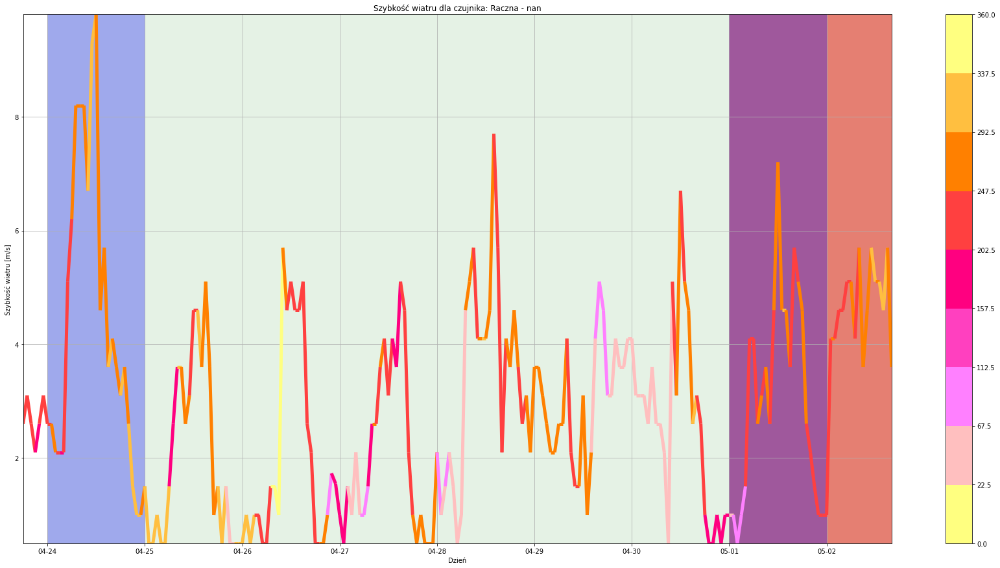

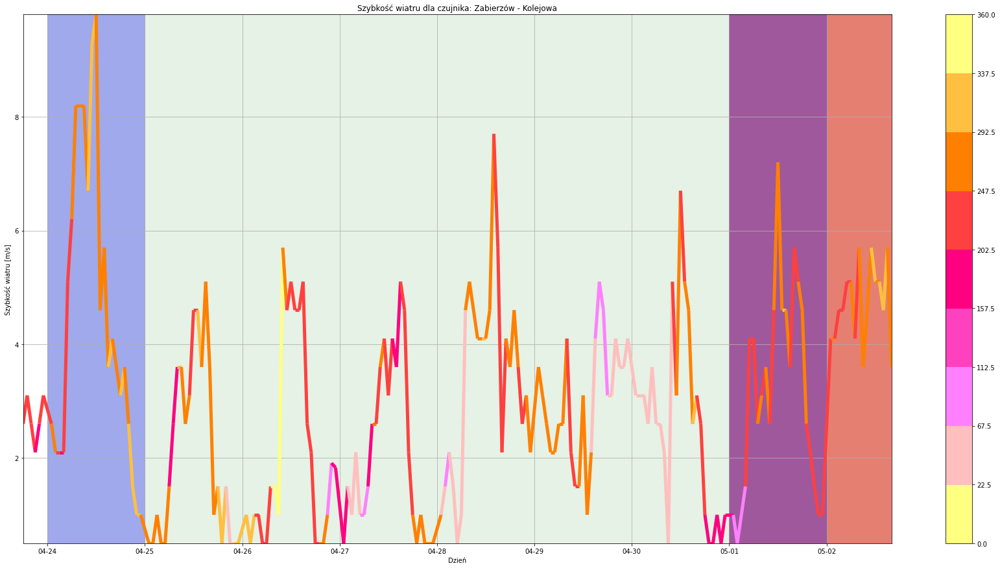

KeyError: 9923

In [71]:
for id in west:
    plot_winddirection(id)

# ================================

# Generowanie treści trac

In [ ]:
from IPython.display import display, HTML

installations_cor = dict()

for id in installationd_id:
    dd = df.loc[df['installationId'] == id][['TEMPERATURE', 'HUMIDITY', 'WINDSPEED']]
    cor = dd.corr().to_numpy()
    
    tab = '|| ||= Temperatura =||= Wilgotność =||= Szybkość wiatru =||\n'
    tab += '||= Temperatura =||'
    for i in cor[0]:
        tab += str(i) + "||"
    tab += '\n||= Wilgotność =||'
    for i in cor[1]:
        tab += str(i) + "||"
    tab += '\n||= Szybkość wiatru =||'
    for i in cor[2]:
        tab += str(i) + "||"
    installations_cor[id] = tab

In [ ]:
pic_number = 1
table_number = 1

def print_station(id):
    global pic_number, table_number
    temp_text = 'Wykres %d: Wykres zależności temperatury od czasu dla czujnika %d' % (pic_number, id)
    pic_number += 1
    hum_text = 'Wykres %d: Wykres zależności wilgotności od czasu dla czujnika %d' % (pic_number, id)
    pic_number += 1
    print("== Czujnik: %d ==" % (id))
    print('[[Image(TEMPERATURE_%d_%d.png, 50%%)]] \\\\ \'\'%s\'\' \\\\' % (id, which_measure, temp_text))
    print('[[Image(HUMIDITY_%d_%d.png, 50%%)]] \\\\ \'\'%s\'\' \\\\' % (id, which_measure, hum_text))
    print()
    print(installations_cor[id])
    print('\'\'Tabela %d: Macierz korelacji pomiędzy temperaturą, wilgotnością a szybkością wiatru dla czujnika %d\'\' \\\\' % (table_number, id))
    table_number += 1
    print("\n")

print("= PÓŁNOC =")
for id in north:
    print_station(id)
    
print('\\\\')
print("= WSCHÓD =")
for id in east:
    print_station(id)

print('\\\\')
print("= POŁUDNIE =")
for id in south:
    print_station(id)

print('\\\\')
print("= ZACHÓD =")
for id in west:
    print_station(id)